# King County House Prices



# Meaning of the columns:

* **id** - unique identified for a house
* **date** - house was sold
* **price** -  is prediction target
* **bedrooms** - Number of Bedrooms/House
* **bathrooms** - Number of bathrooms/bedrooms
* **sqft_living** -  footage of the home
* **sqft_lot** -  footage of the lot
* **floors** -  floors (levels) in house
* **waterfront** - House which has a view to a waterfront
* **view** - Has been viewed
* **condition** - How good the condition is ( Overall )
* **grade** - overall grade given to the housing unit, based on King County grading system
* **sqft_above** - square footage of house apart from basement
* **sqft_basement** - square footage of the basement
* **yr_built** - Built Year
* **yr_renovated** - Year when house was renovated
* **zipcode** - zipcode area
* **lat** - Latitude coordinate
* **long** - Longitude coordinate
* **sqft_living15** - The square footage of interior housing living space for the nearest 15 neighbors
* **sqft_lot15** - The square footage of the land lots of the nearest 15 neighbors

**Bathroom Grades**

? (not found on the internet)

Condition and grade can be found on the King county website (thanx to Simon;))
https://www.kingcounty.gov/depts/assessor/~/media/depts/Assessor/documents/AreaReports/2018/Residential/015.ashx 

**Condition: Relative to Age and Grade**
- 1= Poor Many repairs needed. Showing serious deterioration.
- 2= Fair Some repairs needed immediately. Much deferred maintenance.
- 3= Average Depending upon age of improvement; normal amount of upkeep for the age of the home.
- 4= Good Condition above the norm for the age of the home. Indicates extra attention and care has been taken to maintain.
- 5= Very Good Excellent maintenance and updating on home. Not a total renovation.

**Residential Building Grades**

Grades 1 - 3 Falls short of minimum building standards. Normally cabin or inferior structure. If these wouldn´t have been thrown out already in this dataset, one had to do this.

- Grade 4 Generally older low quality construction. Does not meet code.
- Grade 5 Lower construction costs and workmanship. Small, simple design.
- Grade 6 Lowest grade currently meeting building codes. Low quality materials, simple designs.
- Grade 7 Average grade of construction and design. Commonly seen in plats and older subdivisions.
- Grade 8 Just above average in construction and design. Usually better materials in both the exterior and interior finishes.
- Grade 9 Better architectural design, with extra exterior and interior design and quality.
- Grade 10 Homes of this quality generally have high quality features. Finish work is better, and more design quality is seen in the floor plans and larger square footage.
- Grade 11 Custom design and higher quality finish work, with added amenities of solid woods, bathroom fixtures and more luxurious options.
- Grade 12 Custom design and excellent builders. All materials are of the highest quality and all conveniences are present.
- Grade 13 Generally custom designed and built. Approaching the Mansion level. Large amount of highest quality cabinet work, wood trim and marble; large entries.



# Import Packages and load Dataset

In [222]:
# import packages
%matplotlib inline
import pandas as pd
import matplotlib as plt
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sb

In [223]:
# load data from csv
df = pd.read_csv('King_County_House_prices_dataset.csv') 

# Analyze the dataset

In [224]:
# there are 21.597 sold houses in this dataset each has 21 features
df.shape

(21597, 21)

In [225]:
# describe column date
# the houses were sold between 2nd May 2014 to 27th May 2015
df['date'].describe()  

count         21597
unique          372
top       6/23/2014
freq            142
Name: date, dtype: object

In [226]:
# show columns
# the 21 features are already written in the concise way, no changes needed
df.columns 

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [280]:
# the columns are seperated in the middle bei points
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month_year
0,7129300520,2014-10-13,12.309982,3,1.00,1180,5650,1.0,0.0,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,2014-10
1,6414100192,2014-12-09,13.195614,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014-12
2,5631500400,2015-02-25,12.100712,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,0.0,98028,47.7379,-122.233,2720,8062,2015-02
3,2487200875,2014-12-09,13.311329,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,2014-12
4,1954400510,2015-02-18,13.142166,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,2015-02


In [228]:
# maximize the columns display to make the column "condition" seeable
pd.set_option('display.max_columns', 50) 
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [229]:
# let´s have a look at the datatype of the columns
# date is an object so let´s switch that to datetime
# convert sqft_basement to float
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
id               21597 non-null int64
date             21597 non-null object
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null object
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
dtypes: float64(8), int64(11), object(2)
memory usage: 3.5+ MB


In [230]:
# outlier: max of 33 bedrooms, maybe sqft_lot15 871200, grade already begins with 3
df.describe()  

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


# Cleaning the dataset

In [232]:
# convert column date to timestamp/datetime
df['date'] = pd.to_datetime(df['date'])
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [235]:
# insert new column month_year

In [236]:
df['month_year'] = pd.to_datetime(df['date']).dt.to_period('M')
df.head(7)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month_year
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,2014-10
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014-12
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062,2015-02
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,2014-12
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,2015-02
5,7237550310,2014-05-12,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,3,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930,2014-05
6,1321400060,2014-06-27,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,3,7,1715,?,1995,0.0,98003,47.3097,-122.327,2238,6819,2014-06


In [237]:
# convert sqft_basement to float
# because of the value "?" in row 6 ff. first change that to "sqft_basement = sqft_living - sqft_above" which is 0
# i looked up 3 rows with "?" in all cases the result was 0
df['sqft_basement'] = df['sqft_basement'].replace('?', 0)
df['sqft_basement'] = pd.to_numeric(df['sqft_basement']) 
df.head(7)


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month_year
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,2014-10
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014-12
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062,2015-02
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,2014-12
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,2015-02
5,7237550310,2014-05-12,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,3,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930,2014-05
6,1321400060,2014-06-27,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,3,7,1715,0.0,1995,0.0,98003,47.3097,-122.327,2238,6819,2014-06


In [238]:
# now all of the features are numerical except for the date and month_year
df.info()   

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 22 columns):
id               21597 non-null int64
date             21597 non-null datetime64[ns]
price            21597 non-null float64
bedrooms         21597 non-null int64
bathrooms        21597 non-null float64
sqft_living      21597 non-null int64
sqft_lot         21597 non-null int64
floors           21597 non-null float64
waterfront       19221 non-null float64
view             21534 non-null float64
condition        21597 non-null int64
grade            21597 non-null int64
sqft_above       21597 non-null int64
sqft_basement    21597 non-null float64
yr_built         21597 non-null int64
yr_renovated     17755 non-null float64
zipcode          21597 non-null int64
lat              21597 non-null float64
long             21597 non-null float64
sqft_living15    21597 non-null int64
sqft_lot15       21597 non-null int64
month_year       21597 non-null object
dtypes: datetime64[ns](1), 

# Missing values

The "?" are already replaced. Now we should replace the NaN´s, change the 33 bedrooms in 3 and think what we should do with waterfront with only 19221 entries, view only 21534 entries, yr_renovated only 17755 entries.

In [239]:
# let´s see where the missing NaN´s are
# there are too many to throw these rows out
# let´s replace them all with 0
total = df.isnull().sum().sort_values(ascending=False)  
total

yr_renovated     3842
waterfront       2376
view               63
month_year          0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
condition           0
sqft_lot15          0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
zipcode             0
lat                 0
long                0
sqft_living15       0
id                  0
dtype: int64

In [240]:
# if more than 15% of a feature´s values are missing than drop it?

In [241]:
df = df.fillna(0)   # all NaN replaced by 0.0
df.head(7)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month_year
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,2014-10
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014-12
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,0.0,98028,47.7379,-122.233,2720,8062,2015-02
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,2014-12
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,2015-02
5,7237550310,2014-05-12,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,3,11,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930,2014-05
6,1321400060,2014-06-27,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,3,7,1715,0.0,1995,0.0,98003,47.3097,-122.327,2238,6819,2014-06


# Mistype: The outlier with 33 bedrooms

In [243]:
# lat, long is normal living area no hotel
# bathroom is only 1,75
# so wrong value
df.loc[df['bedrooms'] == 33] 

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month_year
15856,2402100895,2014-06-25,640000.0,33,1.75,1620,6000,1.0,0.0,0.0,5,7,1040,580.0,1947,0.0,98103,47.6878,-122.331,1330,4700,2014-06


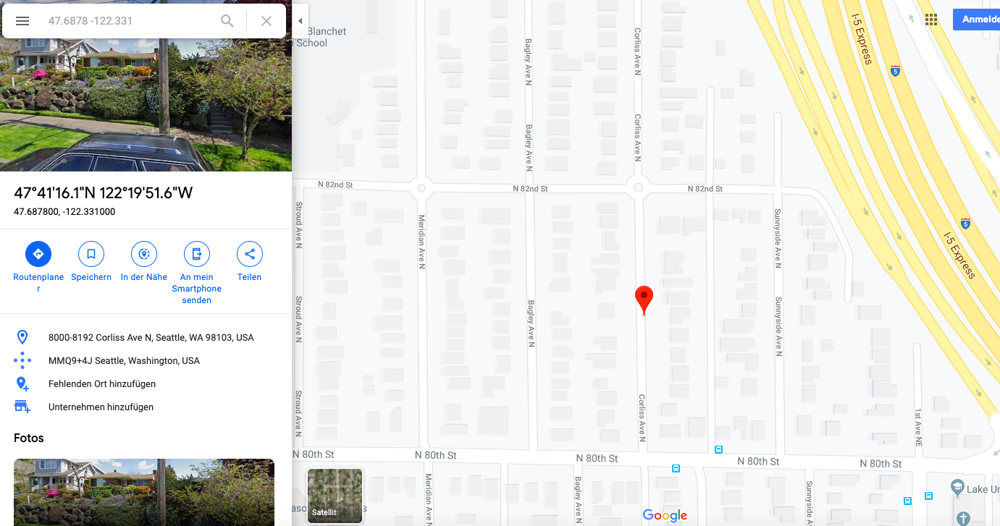

In [244]:
# the median bedroom number for the dataset is 3, same for this zipcode area 98103 (see below)
df['bedrooms'].describe ()

count    21597.000000
mean         3.373200
std          0.926299
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max         33.000000
Name: bedrooms, dtype: float64

Text(0, 0.5, 'Bedrooms')

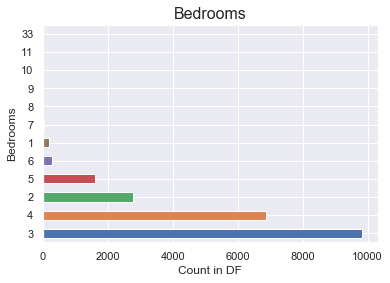

In [245]:
to_graph = df.bedrooms.value_counts()
to_graph.plot(kind='barh') 
plt.title('Bedrooms', fontsize=16) #add a title 
plt.xlabel('Count in DF') 
plt.ylabel('Bedrooms')

In [246]:
zipcode_group = df['bedrooms'].groupby(df['zipcode'])   # zip 98103 at position 5 median bedrooms 3
zipcode_group.median().sort_values(ascending=True)

zipcode
98001    3
98072    3
98092    3
98102    3
98103    3
98105    3
98106    3
98107    3
98108    3
98109    3
98112    3
98115    3
98116    3
98117    3
98118    3
98119    3
98122    3
98125    3
98126    3
98133    3
98136    3
98144    3
98146    3
98148    3
98155    3
98166    3
98168    3
98177    3
98178    3
98188    3
        ..
98028    3
98058    3
98030    3
98031    3
98032    3
98011    3
98034    3
98042    3
98045    3
98003    3
98002    3
98053    3
98055    3
98056    3
98038    3
98010    3
98008    4
98007    4
98006    4
98005    4
98004    4
98059    4
98039    4
98040    4
98052    4
98077    4
98075    4
98074    4
98033    4
98065    4
Name: bedrooms, Length: 70, dtype: int64

In [247]:
df.loc[df.index == 15856, 'bedrooms'] = 3  # therefore value changed to 3

In [248]:
total = df.isnull().sum().sort_values(ascending=False)  # no missing values
total

month_year       0
sqft_lot15       0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
id               0
dtype: int64

# Duplicates? No

In [249]:
duplicate_rows_df = df[df.duplicated()]    # no duplicates
print ("number of duplicate rows: ", duplicate_rows_df.shape)

number of duplicate rows:  (0, 22)


# EDA

In [138]:
# Median grade is 7
df['grade'].describe()

count    21191.000000
mean         7.605304
std          1.108906
min          3.000000
25%          7.000000
50%          7.000000
75%          8.000000
max         12.000000
Name: grade, dtype: float64

In [132]:
# 1890 sqft living median
df['sqft_living'].describe()

count    21191.000000
mean      2032.486103
std        836.738586
min        370.000000
25%       1410.000000
50%       1890.000000
75%       2500.000000
max       7480.000000
Name: sqft_living, dtype: float64

In [135]:
# 2.25 median
df['bathrooms'].describe()

count    21191.000000
mean         2.087514
std          0.736021
min          0.500000
25%          1.500000
50%          2.250000
75%          2.500000
max          7.500000
Name: bathrooms, dtype: float64

In [281]:
# 3 median
df['condition'].describe()

count    21597.000000
mean         3.409825
std          0.650546
min          1.000000
25%          3.000000
50%          3.000000
75%          4.000000
max          5.000000
Name: condition, dtype: float64

# Analyze and normalize target value "price"


In [250]:
# The most expensive house costs 7.7 million $, the cheapest 78.000 $. 
# The mean price is 540.000 and the median is 450.000 $.
df['price'].describe()

count    2.159700e+04
mean     5.402966e+05
std      3.673681e+05
min      7.800000e+04
25%      3.220000e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64

In [251]:
df['price'].min()

78000.0

/Applications/anaconda3/envs/nf/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


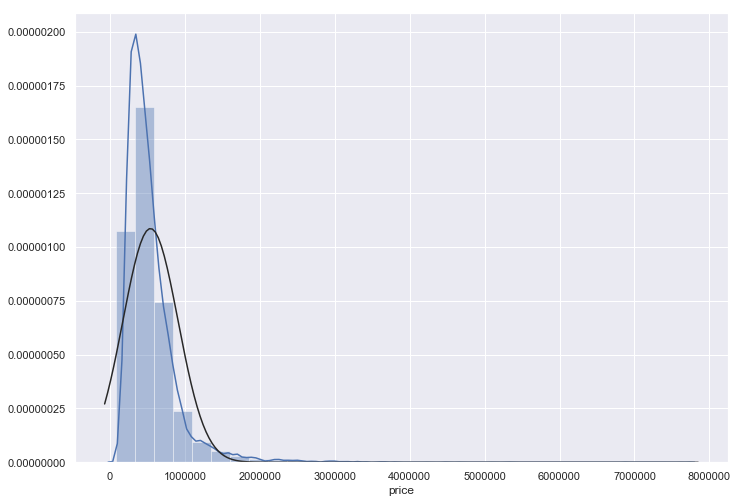

In [252]:
sb.set(rc={'figure.figsize':(11.7,8.27)})
sb.distplot(df['price'], fit=norm, bins=30)
plt.show()

In [253]:
#Let us measure the house sales price curve characteristics: skewness and kurtosis
print("Skewness: %f" % df['price'].skew())
print("Kurtosis: %f" % df['price'].kurt())

Skewness: 4.023365
Kurtosis: 34.541359


In [254]:
#applying log transformation
#df['price'] = np.log(df['price'])

In [270]:
#sb.set(rc={'figure.figsize':(11.7,8.27)})
#sb.distplot(df['price'], fit=norm, bins=30)
#plt.show()

# Cut outliers in price?

In [256]:
#from scipy import stats
#df = df[(np.abs(stats.zscore(df.price)) < 3)]

In [257]:
#from numpy.random import normal
#import numpy as np
#from scipy.stats import norm

In [258]:
#norm.fit(df.price)

In [259]:
#μ = 540296.573
#σ = 367359.634
#pd.Series(normal(loc=μ, scale=σ, size=1000)).hist();

In [260]:
# Plot the histogram.
#plt.hist(df.price, bins=25, normed=True, alpha=0.6, color='g')

# Plot the PDF.
#xmin, xmax = plt.xlim()
#x = np.linspace(xmin, xmax, 100)
#p = norm.pdf(x, μ, σ)
#plt.plot(x, p, 'k', linewidth=2);
#title = "Fit results: mu = {:.2f},  std = {:.2f}".format(μ, σ)
#plt.title(title);

# Visualize Y

Folium Heatmap, Interactive map in Google maps

In [261]:
import folium
m = folium.Map(location=[47.6080, -122.3351])

In [262]:
def generateBaseMap(default_location=[47.6080, -122.3351], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

from folium.plugins import HeatMap
base_map = generateBaseMap()
HeatMap(data=df[['lat', 'long']].groupby(['lat', 'long']).sum().reset_index().values.tolist(), radius=8, max_zoom=13).add_to(base_map)
base_map

/Applications/anaconda3/envs/nf/lib/python3.6/site-packages/pandas/core/groupby/groupby.py:4315: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  stacked_values = np.vstack(map(np.asarray, values))


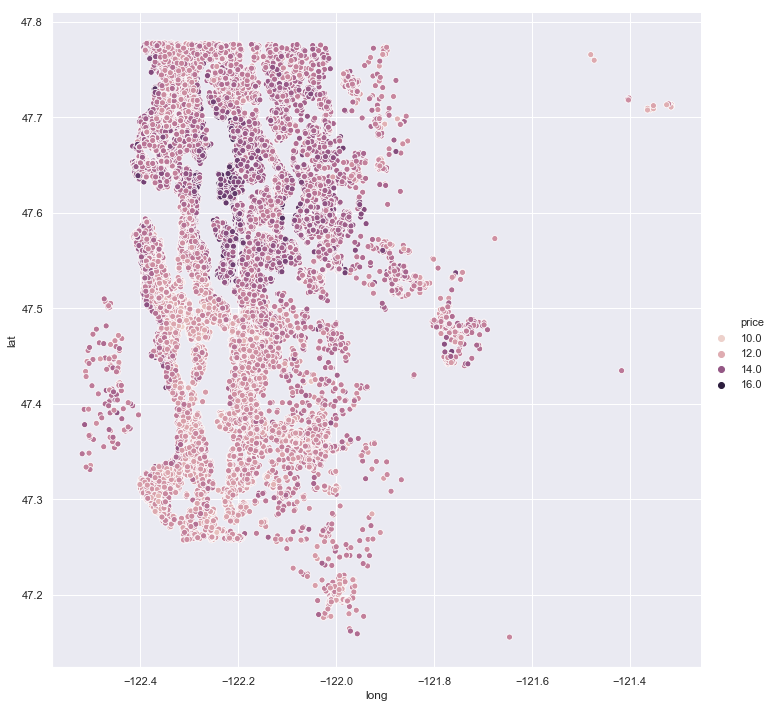

In [263]:
import seaborn as sb
sb.relplot(x='long', y='lat', data=df, hue='price', height=10, sizes=(10, 100))

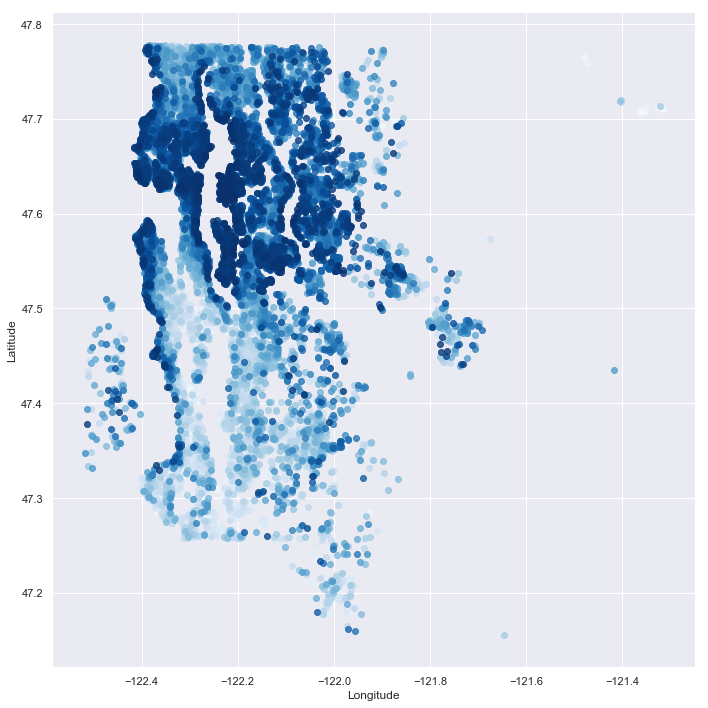

In [264]:
# Color description : light blue - lowest price to dark blue -highest price
sb.lmplot(y="lat", x="long", hue="price", data=df, fit_reg=False, height = 10, legend = False, palette = "Blues")

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

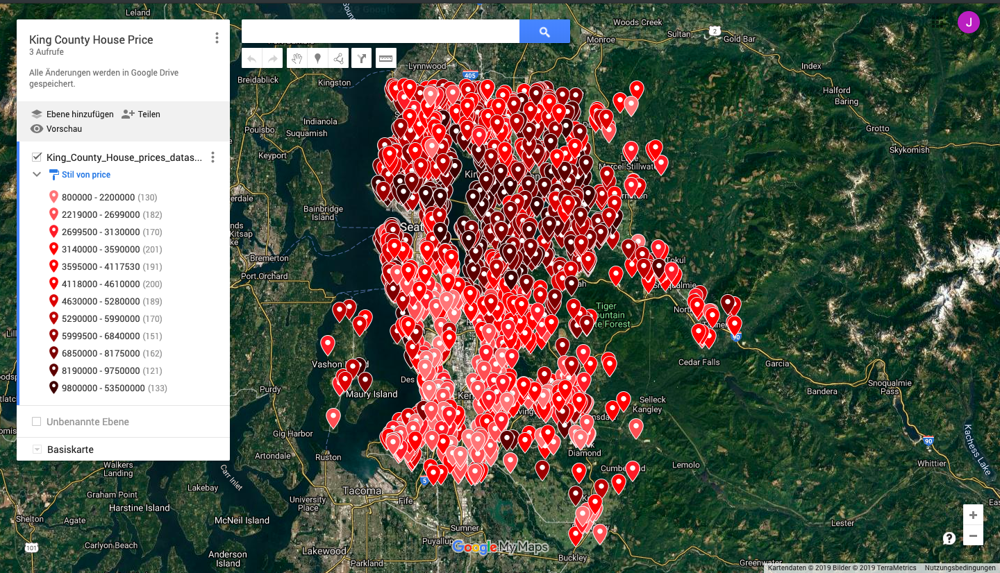

# the most expensive houses are in the north of seattle

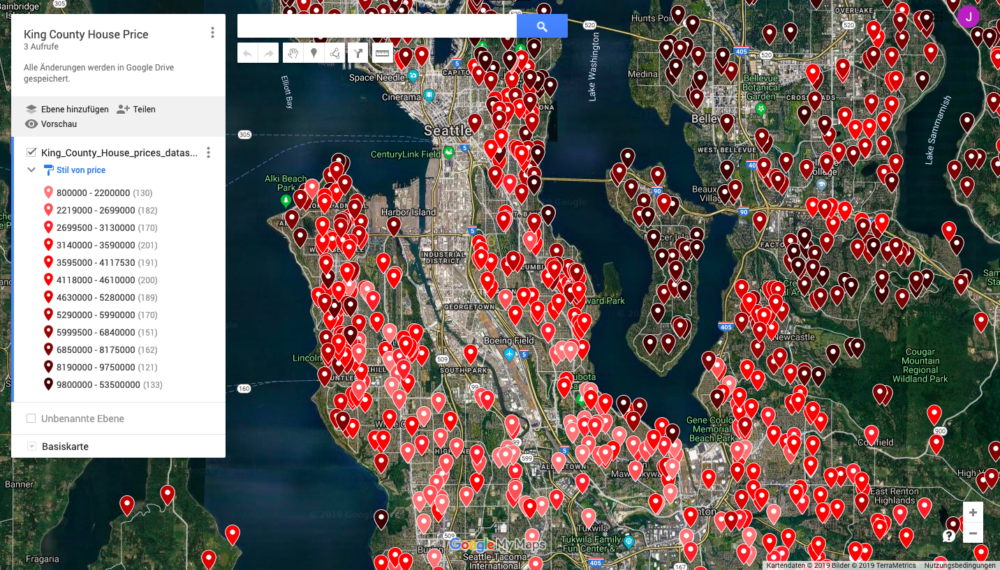

# the cheaper houses are to the south near the airport

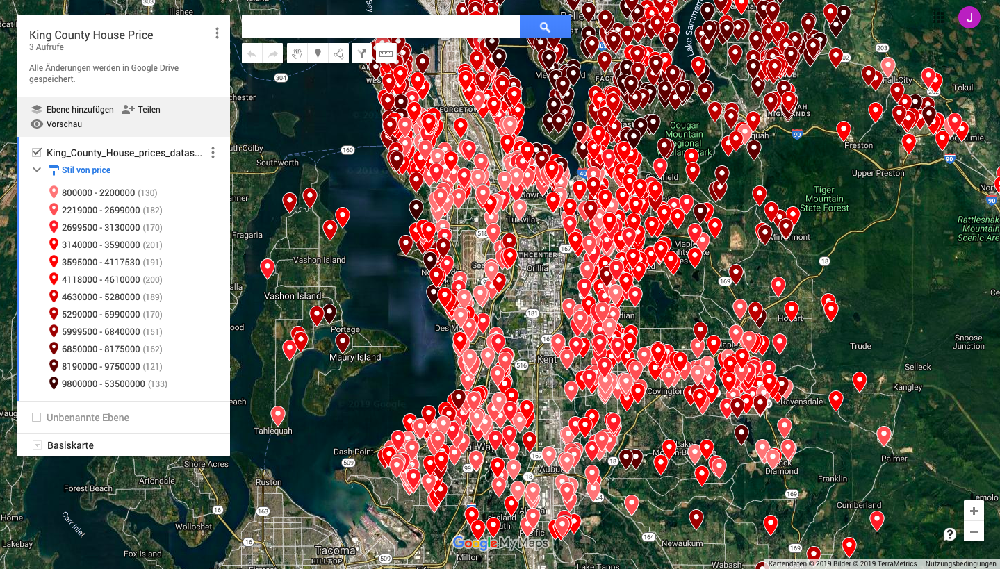

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


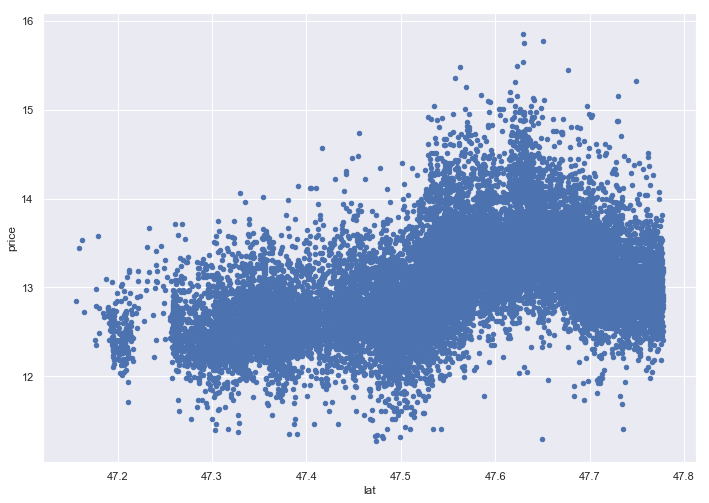

In [283]:
df.plot(x='lat',               # houses between latitude 47.5 and 47.8 are more expensive
        y='price',
        kind='scatter');

# Median price per zipcode

In [287]:
# median price per zipcode
# there are 70 zipcodes
df_zip = df.groupby('zipcode', as_index=False).count()
df_zip.shape

(70, 22)

In [286]:
# most expensive zipcodes  98039, 98004, 98040, 98112, 98005
zipcode_group = df['price'].groupby(df['zipcode'])
zipcode_group.median().sort_values(ascending=False)

zipcode
98039    14.454698
98004    13.955273
98040    13.809241
98112    13.726679
98005    13.548244
98006    13.541316
98119    13.521084
98075    13.514404
98109    13.508985
98102    13.472921
98199    13.444157
98033    13.427419
98105    13.422468
98077    13.388521
98074    13.372344
98053    13.361380
98052    13.329378
98029    13.262125
98122    13.256888
98027    13.254268
98115    13.248115
98116    13.240579
98007    13.226723
98177    13.224920
98103    13.217674
98008    13.208541
98117    13.206705
98107    13.180538
98072    13.151922
98065    13.127339
           ...    
98045    12.910941
98019    12.902335
98126    12.888536
98166    12.873902
98056    12.847927
98133    12.834681
98155    12.834681
98118    12.814479
98010    12.793858
98108    12.744000
98038    12.742566
98058    12.721886
98106    12.660328
98092    12.643618
98146    12.628046
98055    12.594561
98042    12.582795
98031    12.570716
98030    12.550566
98022    12.542545
98178    12.536369
9814

In [ ]:
# Zipcode 98039 Medina, here is the home of Jeff Bezos and Bill Gates (each house costs 150 Mill $)
# the median house price is 1.895.000 $ vs. 450.000$ for the whole dataset
# median income is 80.000 $ year
# credit: https://www.zip-codes.com/county/wa-king.asp

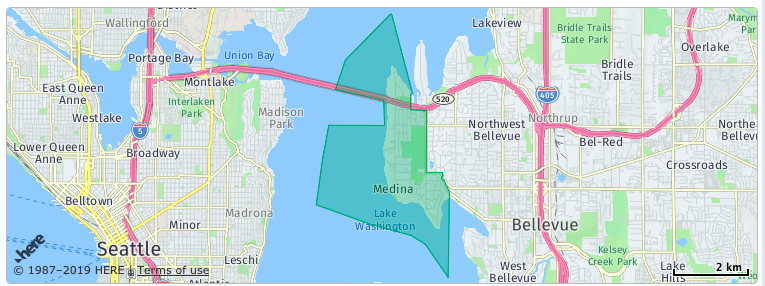

In [ ]:
# 98004 is Bellevue, median house price is 1.150.000 $ 

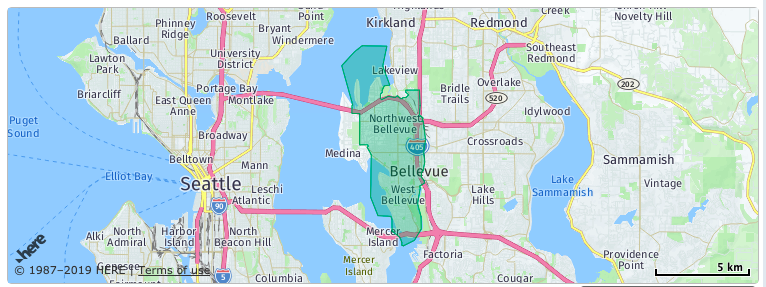

In [58]:
# 98040 is Mercer Island, median house price is 993.750 $ 
# median income is 85.000 $ year
# 85% are white people

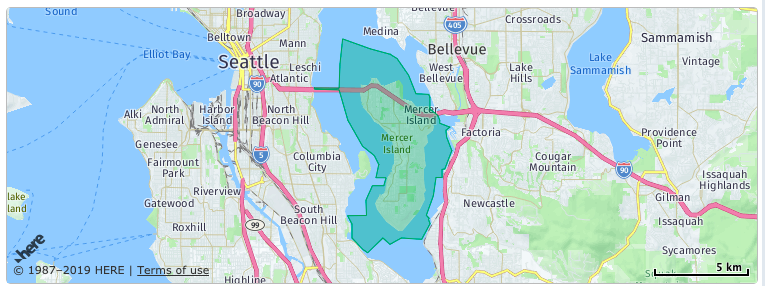

In [ ]:
# 98112 is around Washington Park

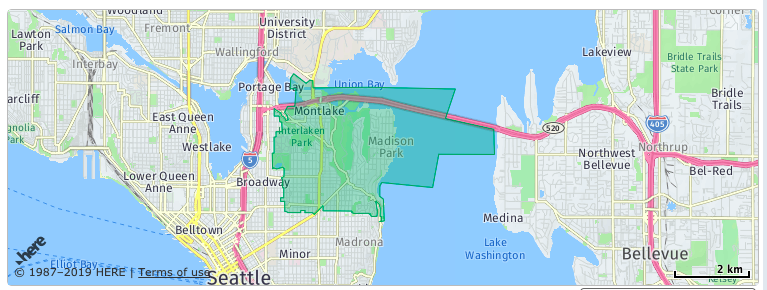

In [ ]:
# 98005 is eastern Bellevue

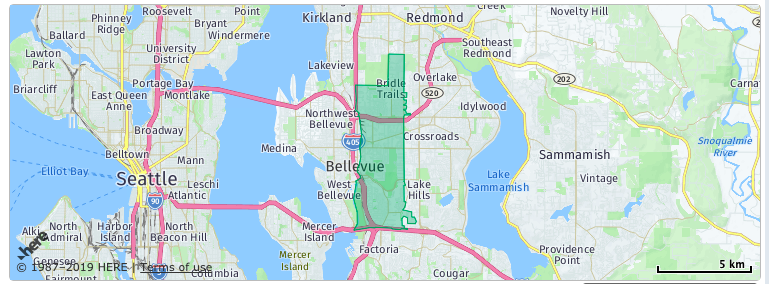

In [ ]:
# 98002 is Auburn in the South, median house price 235.000 

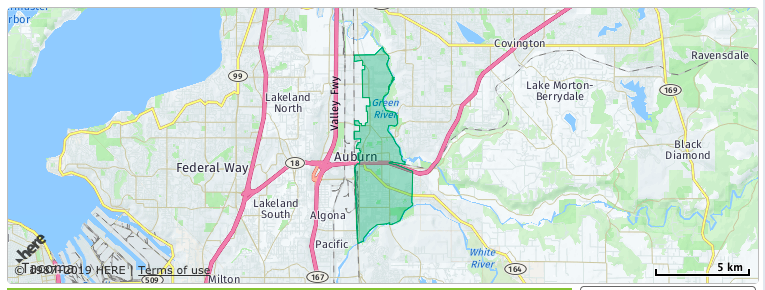

In [ ]:
# median price near airport

# Median price waterfront

In [147]:
# median price waterfront is 1.510.000 $
df['waterfront'].count()  # 19221
waterfront_group = df['price'].groupby(df['waterfront'])
#waterfront_group = df['grade'].groupby(df['waterfront'])
waterfront_group.median().sort_values(ascending=False)

waterfront
1.0    908250.0
0.0    445000.0
Name: price, dtype: float64

In [71]:
# cheaper waterfront houses
# in which zipcodes are cheap waterfront houses
waterfront_group.head()

0       221900.0
1       538000.0
2       180000.0
3       604000.0
4       510000.0
49     1350000.0
230     655000.0
246    2400000.0
264     369900.0
300    3080000.0
Name: price, dtype: float64

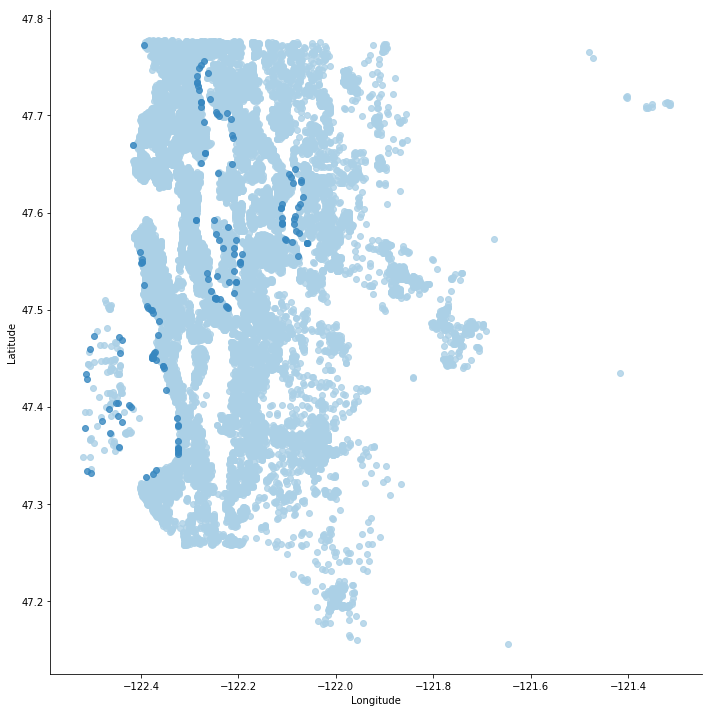

In [54]:
sb.lmplot(y="lat", x="long", hue="waterfront", data=df, fit_reg=False, height = 10, legend = False, palette = "Blues")

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

# Price per month

In [98]:
# mean price per month

In [289]:
#df.sort_values(by=['month_year'], ascending=False)
#total = (df.groupby(df['month_year"])['price'].mean())

# Features vs. Price

# Correlation

In [146]:
# show the correlation of the features with the target
df.corr()['price'].sort_values(ascending=False)

price            1.000000
sqft_living      0.701917
grade            0.667951
sqft_above       0.605368
sqft_living15    0.585241
bathrooms        0.525906
view             0.395734
bedrooms         0.308787
lat              0.306692
waterfront       0.276295
floors           0.256804
yr_renovated     0.129599
sqft_lot         0.089876
sqft_lot15       0.082845
yr_built         0.053953
condition        0.036056
long             0.022036
id              -0.016772
zipcode         -0.053402
Name: price, dtype: float64

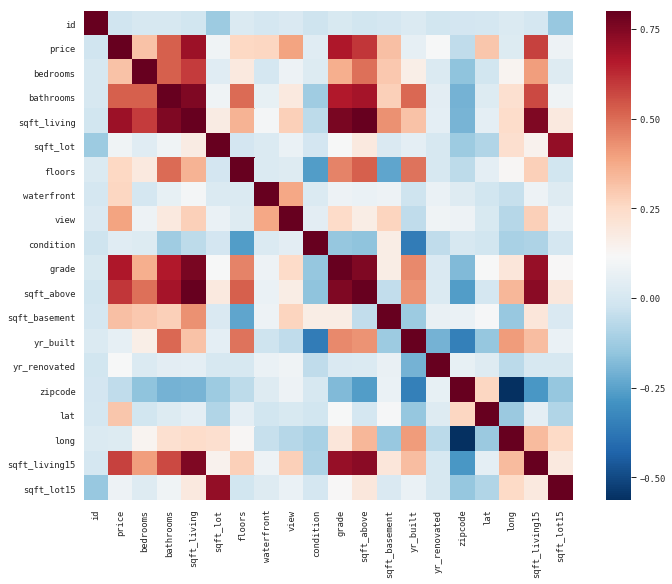

In [81]:
#correlation matrix
sb.set(context="paper", font="monospace")
corrmat = df.corr()
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 9))
# Generate a custom diverging colormap
#cmap = sns.diverging_palette(220, 10, as_cmap=True)
#cmap = sns.diverging_palette(260, 10, as_cmap=True)
# # Drawing the heatmap using seaborn
sb.heatmap(corrmat, vmax=.8, square=True, cmap='RdBu_r');

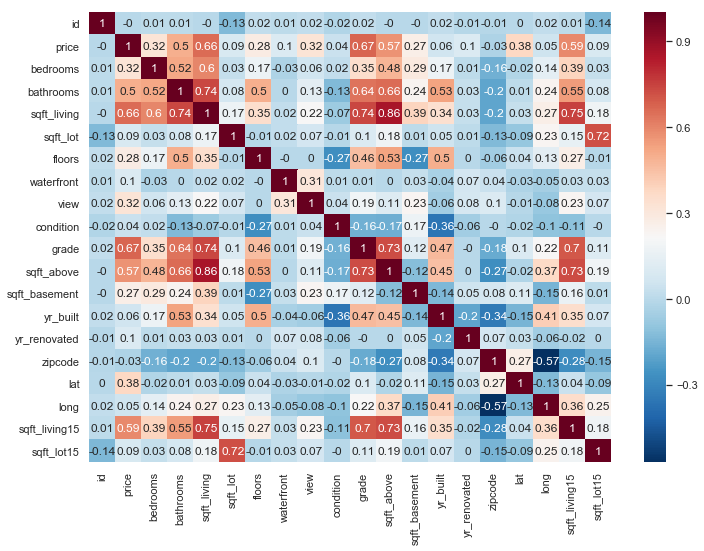

In [175]:
correlation_matrix = df.corr().round(2)
# annot = True to print the values inside the square
sb.heatmap(data=correlation_matrix, annot=True, cmap='RdBu_r')

# Outstanding Features

Sqft_above and sqft_living are highly correlated so i drop "sqft_above" for the model

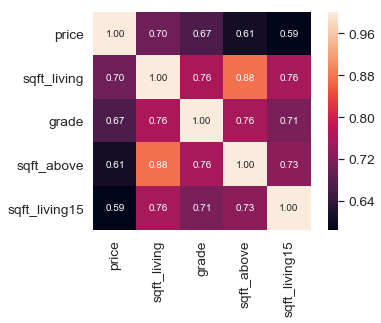

In [82]:
import numpy as np
#saleprice correlation matrix
k = 5 #number of variables for heatmap
cols = corrmat.nlargest(k, 'price')['price'].index
cm = np.corrcoef(df[cols].values.T)
sb.set(font_scale=1.25)
hm = sb.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [76]:
# correlation above 80% between features 
# True if absolute numeric value of correlation r is above 0.8
# true only for sqft_above and sqft_living
abs(df.corr()) > 0.8

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
price,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bedrooms,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bathrooms,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
sqft_living,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
sqft_lot,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
floors,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False
waterfront,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
view,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
condition,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False


In [176]:
# which is r = 0.863
df[['sqft_living', 'sqft_above']].corr()

,sqft_living,sqft_above
sqft_living,1.000000,0.863153
sqft_above,0.863153,1.000000


/Applications/anaconda3/envs/nf/lib/python3.6/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


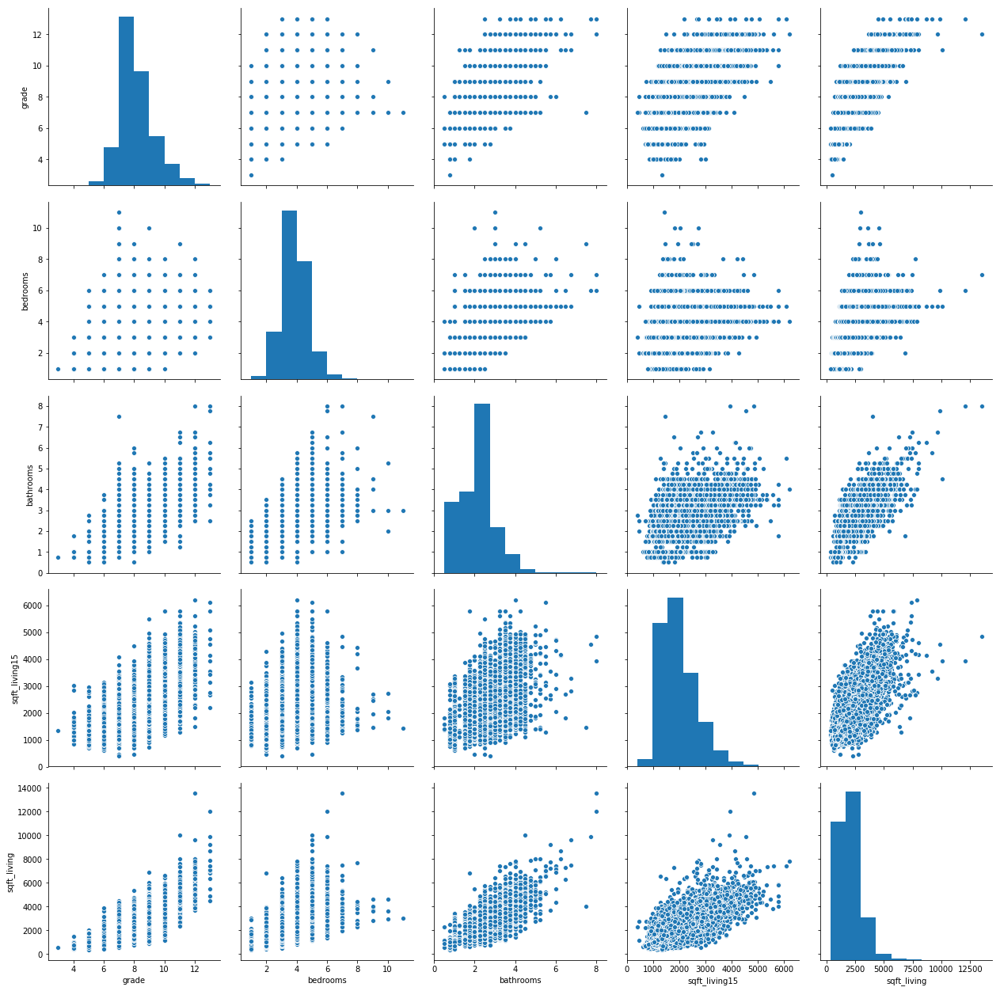

In [72]:
# pairplot of the interesting features
cols = ['grade', 'bedrooms', 'bathrooms', 'sqft_living15', 'sqft_living']
sb.pairplot(df[cols], size = 3.5)
plt.show();

# Relationship of y with numerical variables

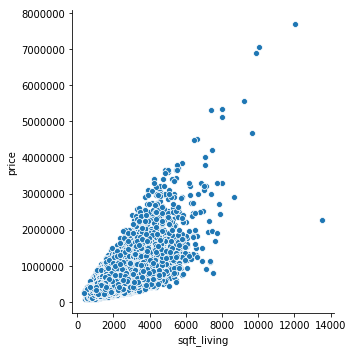

In [7]:
import seaborn as sb
sb.relplot(x='sqft_living', y='price', data=df)

No handles with labels found to put in legend.
/Applications/anaconda3/envs/nf/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


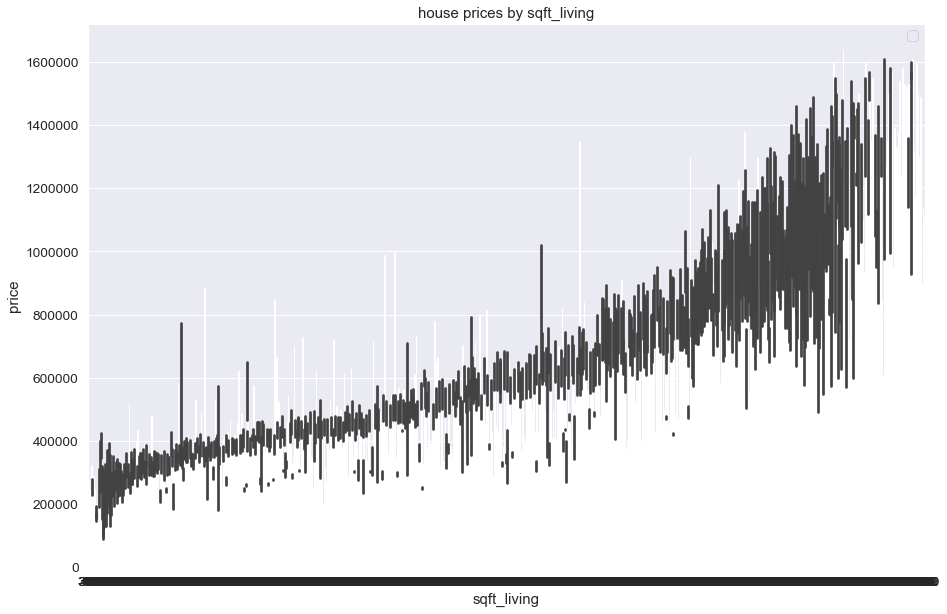

In [119]:
fig,axes = plt.subplots(nrows=1,ncols=1,figsize=(15,10))
plt.title("house prices by sqft_living")
plt.xlabel('sqft_living')
plt.ylabel('price')
plt.legend()
sb.barplot(x='sqft_living',y='price',data=df)

# Relationship of y with categorical variables

These had bad values in the Correlation Matrix, nevertheless they are important features to the target "price"

grade, condition, bathrooms, bedrooms, view, waterfront, zipcode

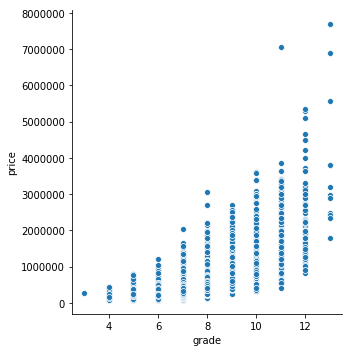

In [26]:
sb.relplot(x='grade', y='price', data=df)

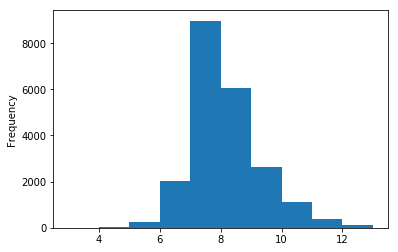

In [20]:
df['grade'].plot(kind='hist')

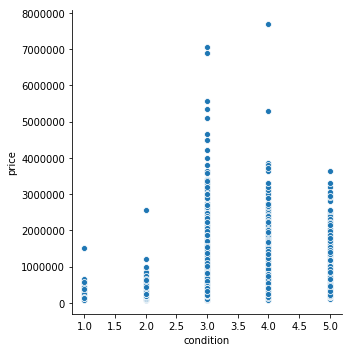

In [16]:
sb.relplot(x='condition', y='price', data=df)

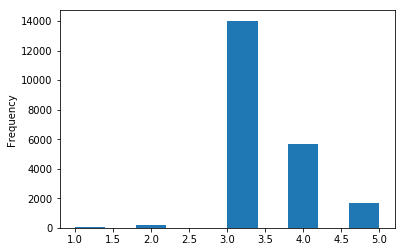

In [19]:
df['condition'].plot(kind='hist') 

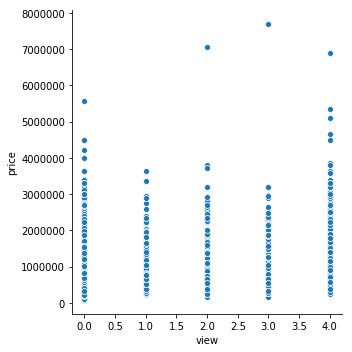

In [17]:
sb.relplot(x='view', y='price', data=df)

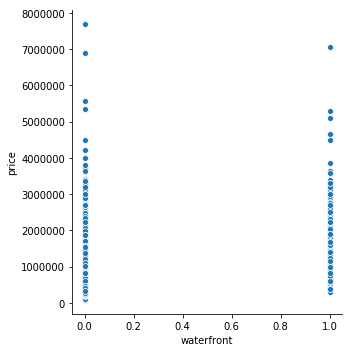

In [18]:
sb.relplot(x='waterfront', y='price', data=df)

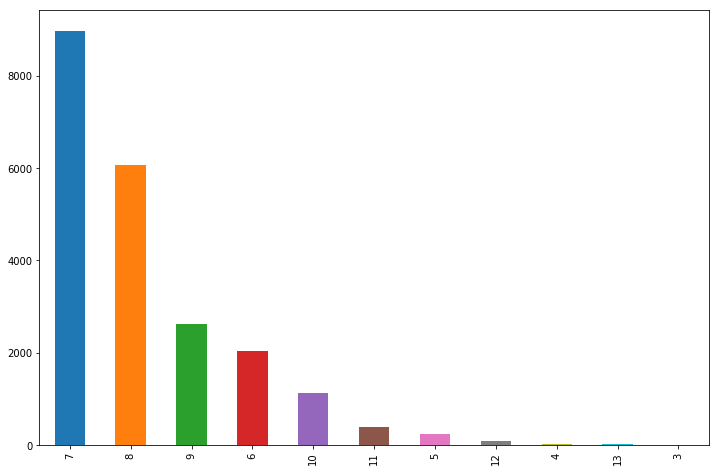

In [28]:
plt.figure(figsize=(12,8))
df.grade.value_counts().plot(kind='bar');

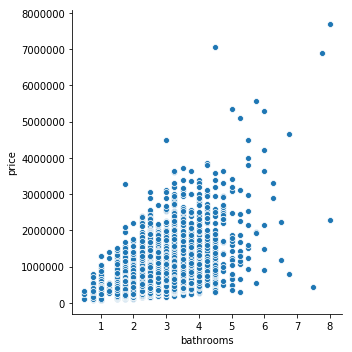

In [70]:
sb.relplot(x='bathrooms', y='price', data=df) # change to 

In [114]:
df['bathrooms'].value_counts()

2.50    5336
1.00    3851
1.75    3044
2.25    2025
2.00    1926
1.50    1445
2.75    1164
3.00     725
3.50     676
3.25     521
3.75     126
4.00     106
4.50      74
0.75      71
4.25      52
5.00      12
1.25       9
5.25       7
4.75       7
5.50       4
0.50       4
6.00       2
5.75       1
7.50       1
6.75       1
6.50       1
Name: bathrooms, dtype: int64

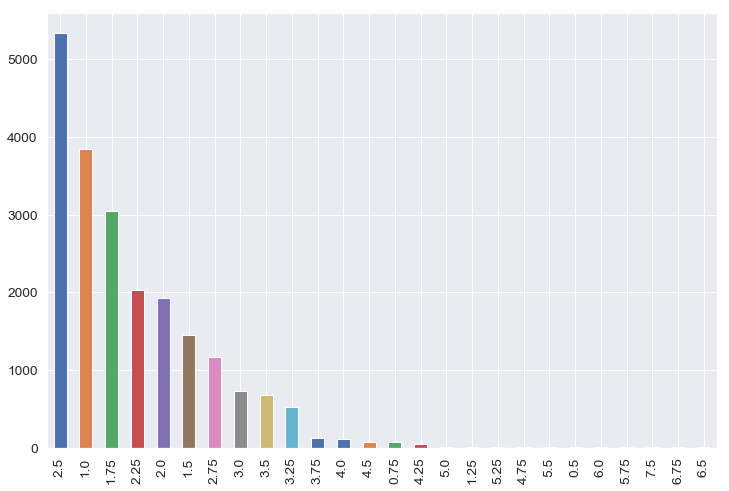

In [116]:
plt.figure(figsize=(12,8))
df.bathrooms.value_counts().plot(kind='bar');

# Multicolinearity: Dummy variables, drop first

Below is the code to change the features into dummies, but later on in the statsmodel.api we can do the same with the function "C". So i will use that

In [91]:
#con_dummies = pd.get_dummies(df['condition'], prefix='con', drop_first=True)
#grade_dummies = pd.get_dummies(df['grade'], prefix='gra', drop_first=True)
#wtf_dummies = pd.get_dummies(df['waterfront'], prefix='wtf', drop_first=True)

In [59]:
#df = df.drop(['grade','condition','waterfront'], axis=1)

In [92]:
#df = pd.concat([df, con_dummies, grade_dummies, wtf_dummies], axis=1)
#df.head()

# Normalisation of features

In [ ]:
# from sklearn.preprocessing import StandardScaler

# scaler = preprocessing.StandardScaler()
# scaled_df = scaler.fit_transform(df)
# scaled_df = pd.df(scaled_df, columns=['sqft_living', 'x2', 'x3'])

# Prediction 

In [97]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,month_year
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0.0,0.0,3,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650,2014-10
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014-12
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,3,6,770,0.0,1933,0.0,98028,47.7379,-122.233,2720,8062,2015-02
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,2014-12
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,2015-02


# Split Train and test data

In [213]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression

# Prepare the data for training
# Split data into features and target
# Drop bad features

X = df.drop(['id', 'date', 'price', 'month_year', 'waterfront', 'yr_renovated'], axis=1)
Y = df[['price']]

In [214]:
# Crossvalidate the model
model = LinearRegression()

scores = cross_val_score(model, X, y, cv=10)
print("Cross-validation scores: {}".format(scores))
print("Average cross-validation score: {:.2f}".format(scores.mean()))

Cross-validation scores: [0.72440274 0.70452309 0.71218485 0.6963822  0.71140846 0.70121725
 0.73034658 0.71080272 0.69365983 0.67988994]
Average cross-validation score: 0.71


In [215]:
# Split data set into training and test sets
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state=5)
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(16952, 16)
(4239, 16)
(16952, 1)
(4239, 1)


In [216]:
# fit the train model
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

lin_model = LinearRegression()
lin_model.fit(X_train, Y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [217]:
# model evaluation for training set
# get Root Mean Square Error RMSE an R2
y_train_predict = lin_model.predict(X_train)
rmse = (np.sqrt(mean_squared_error(Y_train, y_train_predict)))
r2 = r2_score(Y_train, y_train_predict)

print("The model performance for training set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))
print("\n")

# model evaluation for testing set
y_test_predict = lin_model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(Y_test, y_test_predict)))
r2 = r2_score(Y_test, y_test_predict)

print("The model performance for testing set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

The model performance for training set
--------------------------------------
RMSE is 0.24715771740657508
R2 score is 0.7364695454643297


The model performance for testing set
--------------------------------------
RMSE is 0.25338144782945715
R2 score is 0.737122620911731


# Calculate R-squared

In [201]:
import statsmodels.api as sms

In [208]:
# P-value for some grade is high
import statsmodels.formula.api as smf
model = 'price ~ sqft_living + C(grade) + sqft_living15 + C(view) + C(zipcode) + lat'
smf.ols(formula = model, data = df).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.829
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     1205.
Date:                Sun, 03 Nov 2019   Prob (F-statistic):               0.00
Time:                        21:04:43   Log-Likelihood:            -2.7552e+05
No. Observations:               21191   AIC:                         5.512e+05
Df Residuals:                   21105   BIC:                         5.519e+05
Df Model:                          85                                         
Covariance Type:            nonrobust                                         
=======================================================================================
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept           -5.643e+06   2.02e+06     -2.796      0.005    -9.6e+06   -1.69e+06
C(grade)[T.4]       -1.571e+05    1.1e+05     -1.433      0.152   -3.72e+05    5.79e+04
C(grade)[T.5]       -1.651e+05   1.08e+05     -1.530      0.126   -3.77e+05    4.64e+04
C(grade)[T.6]       -1.643e+05   1.08e+05     -1.525      0.127   -3.75e+05    4.68e+04
C(grade)[T.7]       -1.535e+05   1.08e+05     -1.425      0.154   -3.65e+05    5.76e+04
C(grade)[T.8]       -1.218e+05   1.08e+05     -1.131      0.258   -3.33e+05    8.93e+04
C(grade)[T.9]       -3.735e+04   1.08e+05     -0.347      0.729   -2.49e+05    1.74e+05
C(grade)[T.10]        4.35e+04   1.08e+05      0.403      0.687   -1.68e+05    2.55e+05
C(grade)[T.11]       1.509e+05   1.08e+05      1.397      0.162   -6.08e+04    3.63e+05
C(grade)[T.12]       2.615e+05    1.1e+05      2.387      0.017    4.68e+04    4.76e+05
C(view)[T.1.0]       7.025e+04   6322.398     11.112      0.000    5.79e+04    8.26e+04
C(view)[T.2.0]       7.051e+04   3799.565     18.557      0.000    6.31e+04     7.8e+04
C(view)[T.3.0]       1.374e+05   5307.796     25.889      0.000    1.27e+05    1.48e+05
C(view)[T.4.0]       2.848e+05   7533.804     37.801      0.000     2.7e+05       3e+05
C(zipcode)[T.98002]  1.912e+04   9512.857      2.010      0.044     470.720    3.78e+04
C(zipcode)[T.98003] -3512.4062   8571.023     -0.410      0.682   -2.03e+04    1.33e+04
C(zipcode)[T.98004]  5.878e+05   1.58e+04     37.093      0.000    5.57e+05    6.19e+05
C(zipcode)[T.98005]  3.009e+05   1.64e+04     18.375      0.000    2.69e+05    3.33e+05
C(zipcode)[T.98006]  2.418e+05   1.31e+04     18.514      0.000    2.16e+05    2.67e+05
C(zipcode)[T.98007]  2.292e+05   1.67e+04     13.726      0.000    1.96e+05    2.62e+05
C(zipcode)[T.98008]  2.226e+05   1.56e+04     14.295      0.000    1.92e+05    2.53e+05
C(zipcode)[T.98010]  8.755e+04   1.22e+04      7.176      0.000    6.36e+04    1.11e+05
C(zipcode)[T.98011]   8.24e+04   2.13e+04      3.875      0.000    4.07e+04    1.24e+05
C(zipcode)[T.98014]  7.445e+04   1.91e+04      3.895      0.000     3.7e+04    1.12e+05
C(zipcode)[T.98019]   4.72e+04   2.06e+04      2.290      0.022    6793.453    8.76e+04
C(zipcode)[T.98022]  3.577e+04   9983.521      3.583      0.000    1.62e+04    5.53e+04
C(zipcode)[T.98023] -2.218e+04   7434.747     -2.983      0.003   -3.68e+04   -7604.727
C(zipcode)[T.98024]  1.506e+05   1.72e+04      8.759      0.000    1.17e+05    1.84e+05
C(zipcode)[T.98027]   1.58e+05   1.19e+04     13.225      0.000    1.35e+05    1.81e+05
C(zipcode)[T.98028]  7.905e+04   2.08e+04      3.796      0.000    3.82e+04     1.2e+05
C(zipcode)[T.98029]  1.891e+05   1.35e+04     13.989      0.000    1.63e+05    2.16e+05
C(zipcode)[T.98030] -1750.7171   9144.041     -0.191      0.848   -1.97e+04    1.62e+04
C(z

# Gradient Boosting Regression

In [ ]:
# To get a better prediction score we cn use "Gradient Boosting Regression"
# further reading: https://towardsdatascience.com/create-a-model-to-predict-house-prices-using-python-d34fe8fad88f